In [14]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
def show_image(img, title="Image"):
    plt.imshow(img, cmap='gray' if len(img.shape) == 2 else None)
    plt.title(title)
    plt.axis('off')

def shift_image(img, dx, dy):
    rows, cols = img.shape
    M = np.float32([[1, 0, dx], [0, 1, dy]])
    return cv2.warpAffine(img, M, (cols, rows))

def invert_image(img):
    return 255 - img

def gaussian_blur(img, kernel_size=(11, 11)):
    return cv2.GaussianBlur(img, kernel_size, 0)

def motion_blur(img, size=7):
    kernel = np.eye(size) / size
    return cv2.filter2D(img, -1, kernel)

def sharpen_image(img):
    kernel = np.array([[-1, -1, -1],
                       [-1,  9, -1],
                       [-1, -1, -1]])
    return cv2.filter2D(img, -1, kernel)

def sobel_filter(img):
    sobel_vertical_kernel = np.array([
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ])
    return cv2.filter2D(img, -1, sobel_vertical_kernel)

def edge_detection(img):
    edge_detection_kernel = np.array([
        [-1, -1, -1],
        [-1,  8, -1],
        [-1, -1, -1]
    ])
    return cv2.filter2D(img, -1, edge_detection_kernel)

def colorful_sky(img):
    gradient = np.linspace(0, 1, img.shape[1])
    gradient = np.tile(gradient, (img.shape[0], 1))
    colorful = img * gradient
    colorful = cv2.applyColorMap(colorful.astype(np.uint8), cv2.COLORMAP_JET)
    return colorful

def pixel_mosaic(img, block_size=10):
    mosaic_img = img.copy()
    rows, cols = img.shape

    for i in range(0, rows, block_size):
        for j in range(0, cols, block_size):
            block = img[i:i + block_size, j:j + block_size]
            mean_color = int(np.mean(block))
            mosaic_img[i:i + block_size, j:j + block_size] = mean_color

    return mosaic_img



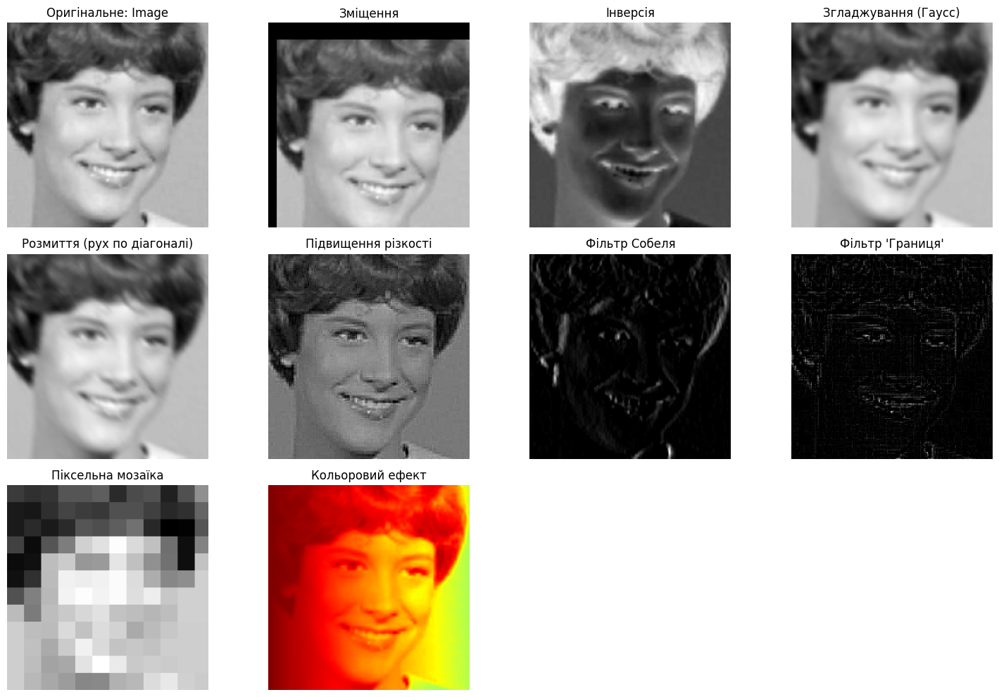

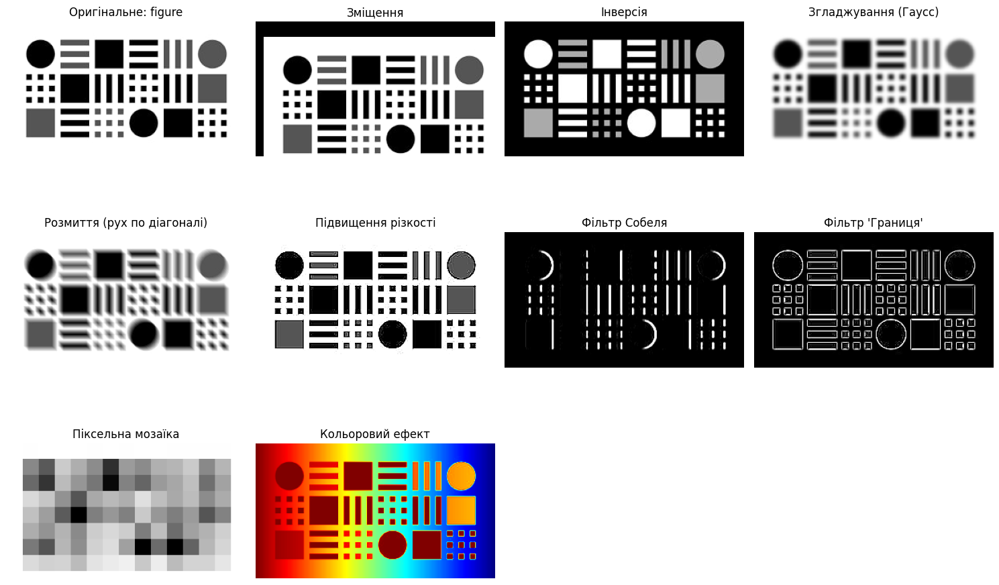

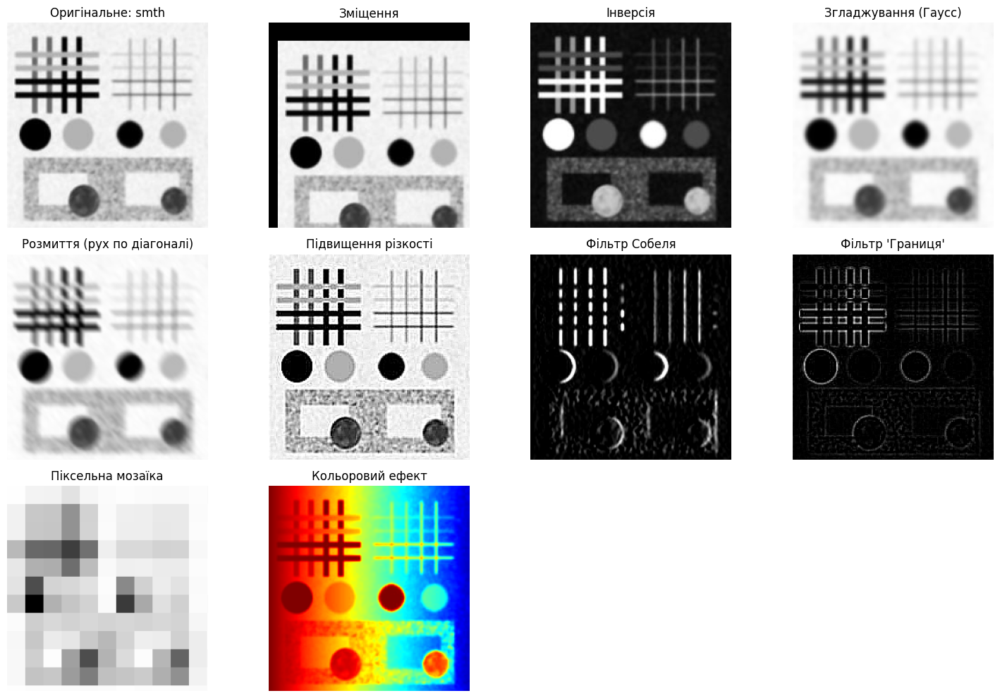

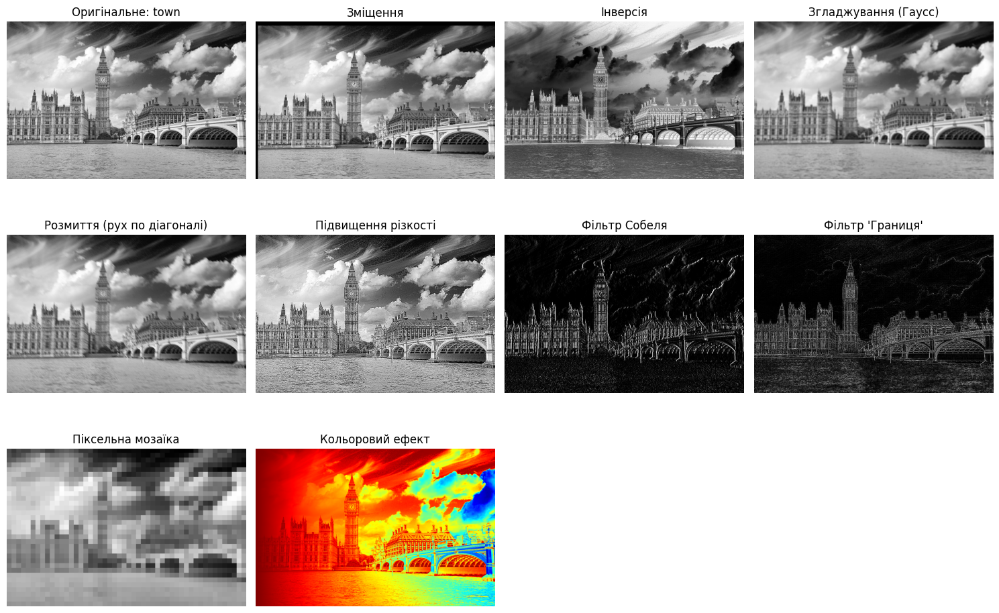

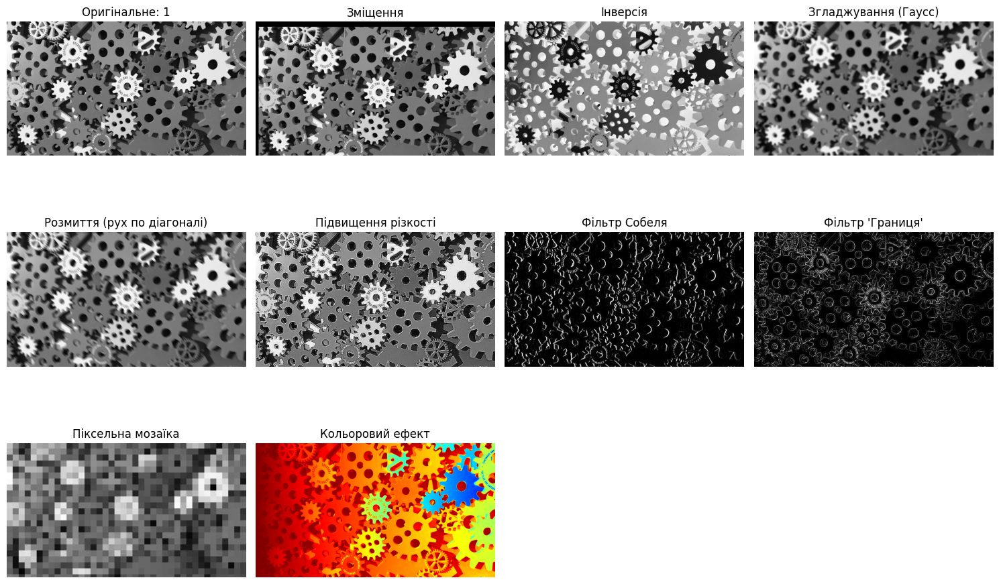

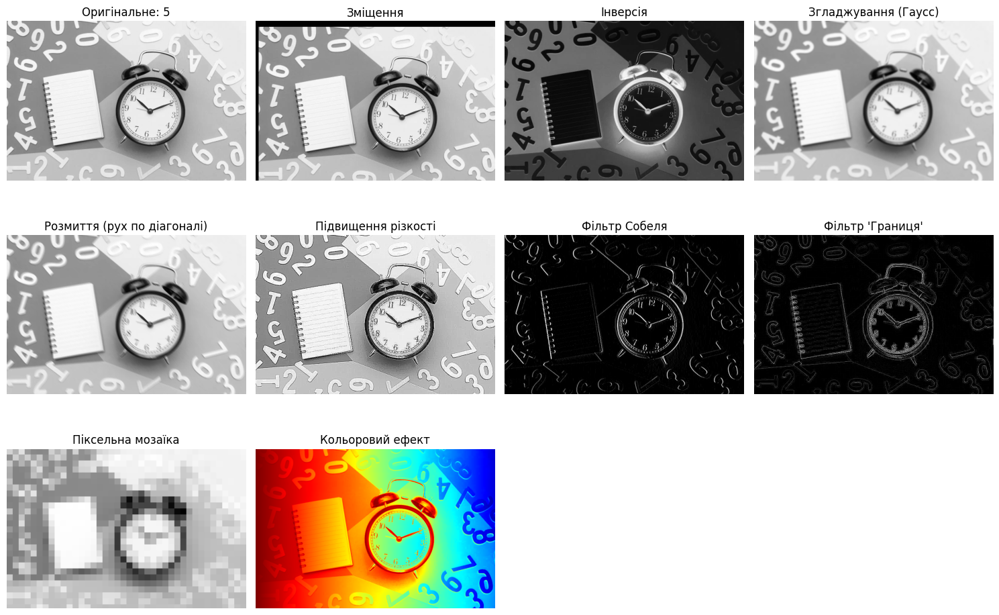

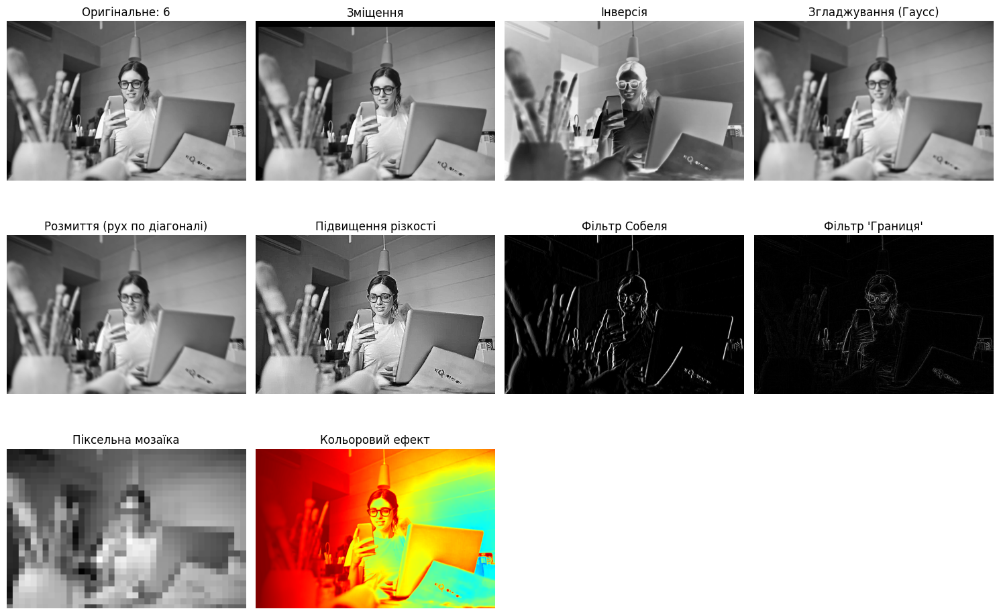

In [16]:
image_files = ["Image.jpg", "figure.jpg", "smth.jpg", "town.jpg", "1.jpeg", "5.png", "6.png"]

for image_path in image_files:
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    plt.figure(figsize=(15, 10))
    plt.subplot(3, 4, 1)
    show_image(img, f"Оригінальне: {image_path.split('.')[0]}")

    filters = [
        ("Зміщення", shift_image(img, 10, 20)),
        ("Інверсія", invert_image(img)),
        ("Згладжування (Гаусс)", gaussian_blur(img)),
        ("Розмиття (рух по діагоналі)", motion_blur(img)),
        ("Підвищення різкості", sharpen_image(img)),
        ("Фільтр Собеля", sobel_filter(img)),
        ("Фільтр 'Границя'", edge_detection(img)),
        ("Піксельна мозаїка", pixel_mosaic(img, block_size=20)),
        ("Кольоровий ефект", colorful_sky(img))
    ]

    for i, (filter_name, filtered_img) in enumerate(filters, start=2):
        plt.subplot(3, 4, i)
        show_image(filtered_img, filter_name)

    plt.tight_layout()
    plt.show()

In [17]:
# 1
def thermal_map_effect(img):
    normalized_img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX)
    thermal_img = cv2.applyColorMap(normalized_img.astype(np.uint8), cv2.COLORMAP_INFERNO)
    return thermal_img

# 2
def glass_distortion(img, intensity=5):
    rows, cols = img.shape
    map_x = np.zeros_like(img, dtype=np.float32)
    map_y = np.zeros_like(img, dtype=np.float32)

    for i in range(rows):
        for j in range(cols):
            map_x[i, j] = j + np.random.uniform(-intensity, intensity)
            map_y[i, j] = i + np.random.uniform(-intensity, intensity)

    distorted_img = cv2.remap(img, map_x, map_y, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT)
    return distorted_img

# 3
def retro_tv_effect(img):
    striped_img = img.copy()
    for i in range(0, img.shape[0], 2):
        striped_img[i, :] = striped_img[i, :] * 0.5
    return striped_img

# 4
def cosmic_dust_effect(img, num_stars=500, intensity=255):
    dusty_img = img.copy()
    rows, cols = img.shape
    for _ in range(num_stars):
        x = np.random.randint(0, cols)
        y = np.random.randint(0, rows)
        dusty_img[y, x] = intensity
    return dusty_img

# 5
def vhs_noise_effect(img):
    rows, cols = img.shape
    noisy_img = img + np.random.normal(0, 25, img.shape).astype(np.uint8)

    red_channel = noisy_img.copy()
    green_channel = cv2.warpAffine(noisy_img, np.float32([[1, 0, -2], [0, 1, 0]]), (cols, rows))
    blue_channel = cv2.warpAffine(noisy_img, np.float32([[1, 0, 2], [0, 1, 0]]), (cols, rows))
    vhs_img = cv2.merge((blue_channel, green_channel, red_channel))

    return vhs_img

def show_image(img, title="Image"):
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB) if len(img.shape) == 3 else img, cmap='gray')
    plt.title(title)
    plt.axis('off')


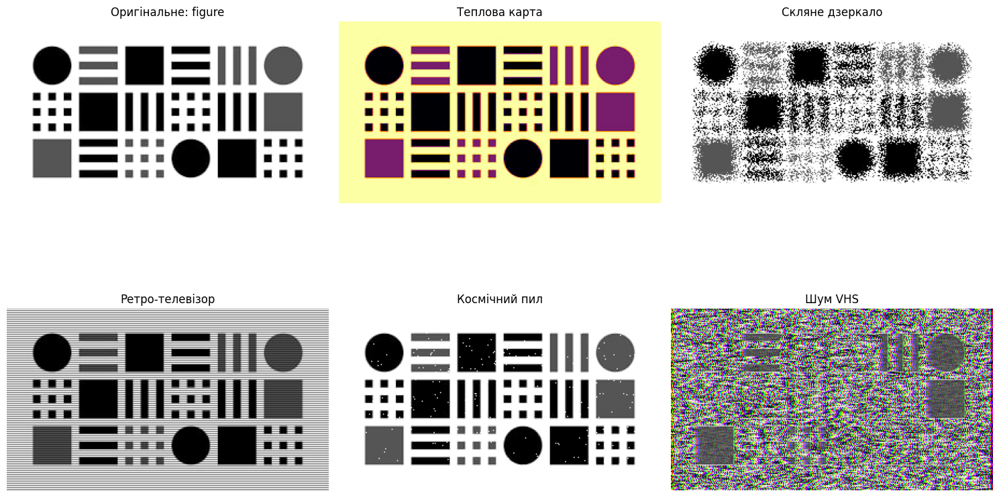

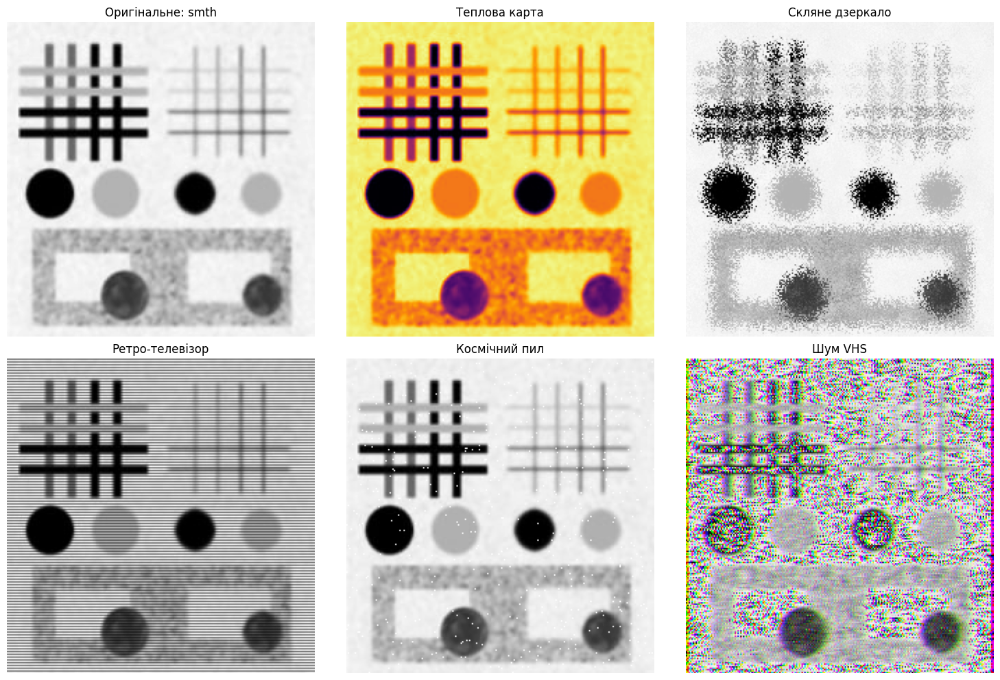

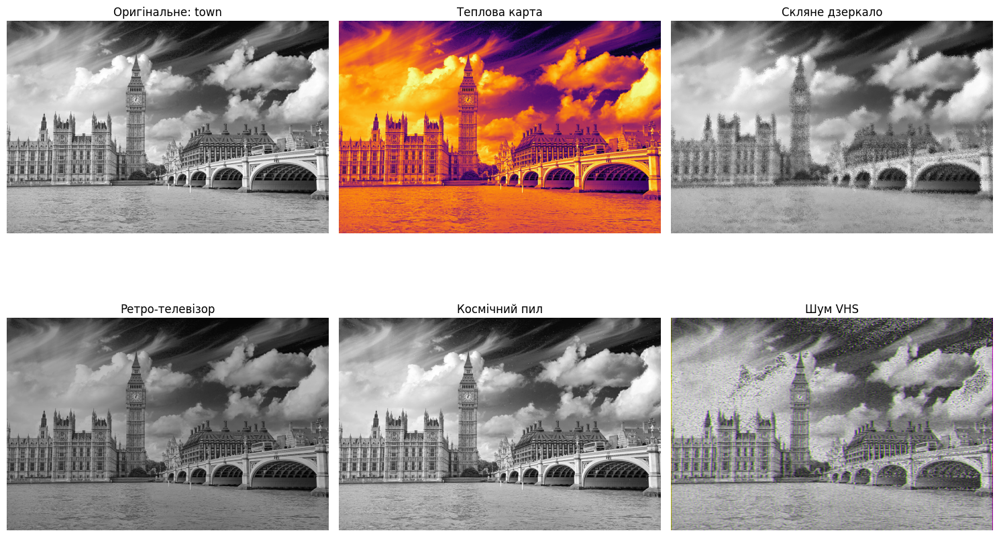

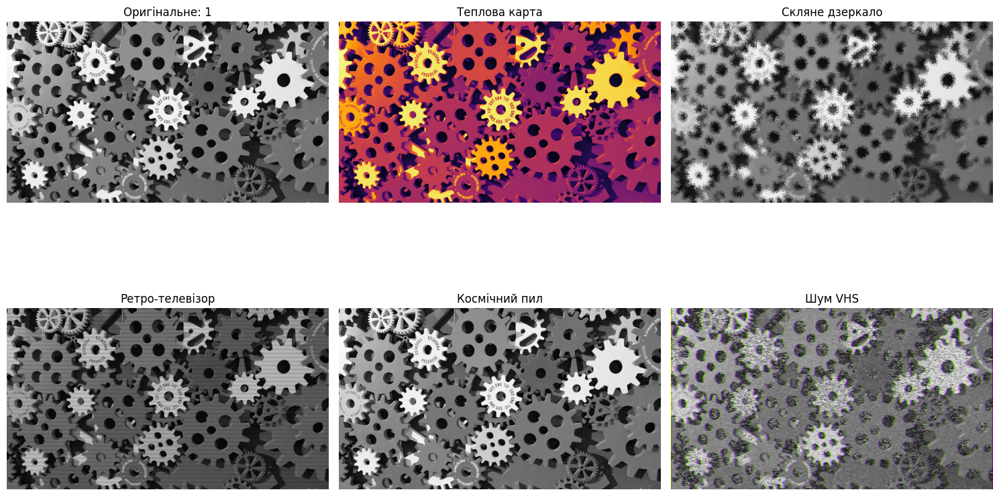

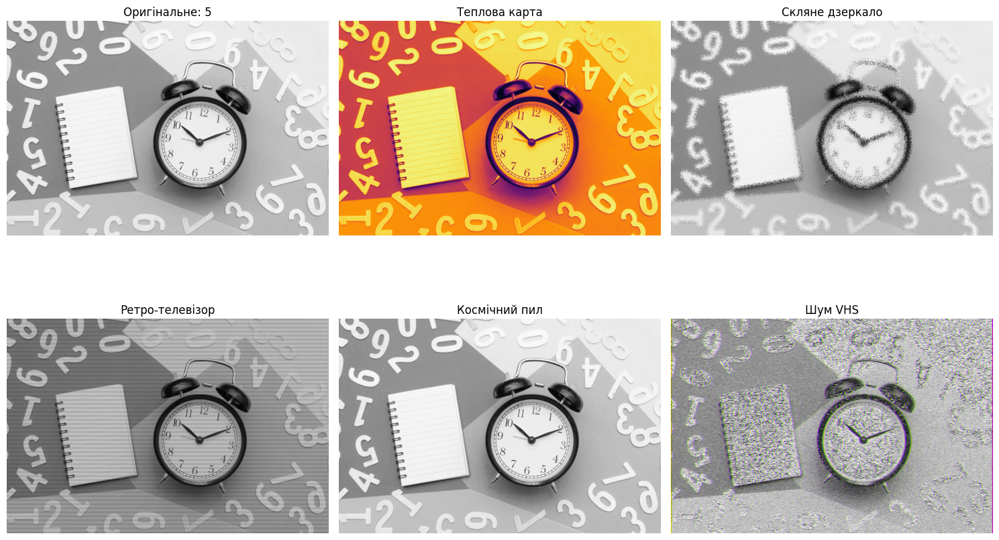

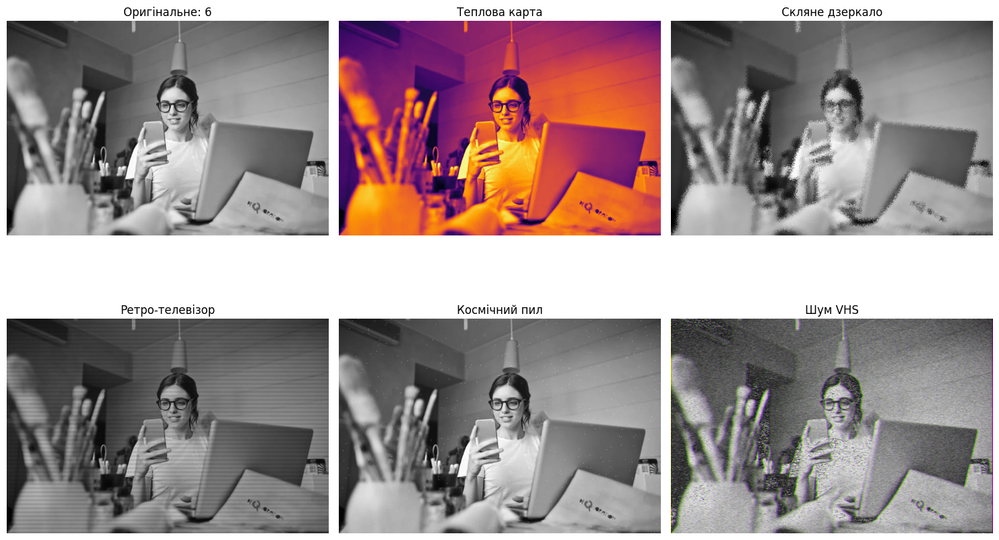

In [18]:
image_files = ["figure.jpg", "smth.jpg", "town.jpg", "1.jpeg", "5.png", "6.png"]

for image_path in image_files:
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        print(f"Помилка: зображення {image_path} не вдалося завантажити.")
        continue

    plt.figure(figsize=(15, 10))
    plt.subplot(2, 3, 1)
    show_image(img, f"Оригінальне: {image_path.split('.')[0]}")
    filters = [
        ("Теплова карта", thermal_map_effect(img)),
        ("Скляне дзеркало", glass_distortion(img)),
        ("Ретро-телевізор", retro_tv_effect(img)),
        ("Космічний пил", cosmic_dust_effect(img)),
        ("Шум VHS", vhs_noise_effect(img))
    ]

    for i, (filter_name, filtered_img) in enumerate(filters, start=2):
        plt.subplot(2, 3, i)
        show_image(filtered_img, filter_name)

    plt.subplots_adjust(hspace=0.3, wspace=0.3)

    plt.tight_layout()
    plt.show()